## Indexed Image

In [351]:
import cv2
import numpy as np
from scipy import io, ndimage, fftpack
import matplotlib.pyplot as plt
from skimage.util import random_noise

%matplotlib inline

In [627]:
I = cv2.imread("assets/peppers.png")
I2 = I[:, :, ::-1]  # convert BGR to RGB

In [628]:
gray = cv2.cvtColor(I, cv2.COLOR_BGR2GRAY)
binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY)[1]
np.unique(binary)

array([255], dtype=uint8)

In [630]:
binary.dtype

dtype('uint8')

In [631]:
ret, labels = cv2.connectedComponents(binary)


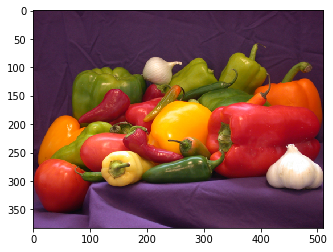

In [632]:
plt.imshow(I2)

## batch processing

In [ ]:
def Process(I):
    I1 = cv2.cvtColor(I, cv2.COLOR_RGB2GRAY)
    height, width = I1.shape
    newX, newY = width*0.75, height*0.75
    I2 = cv2.resize(I1, (int(newX), int(newY)))
    I3 = np.fliplr(I2)
    Iout = cv2.rotate(I3, cv2.ROTATE_90_COUNTERCLOCKWISE)
    fig, ax = plt.subplots(2,3, figsize=(20,12))
    ax[0][0].imshow(I)
    ax[0][0].set_title('Input Image')
    
    ax[0][1].imshow(I1, cmap='gray')
    ax[0][1].set_title('Gray-scale Image')

    ax[0][2].imshow(I2, cmap='gray')
    ax[0][2].set_title('Resized Image')
    
    ax[1][0].imshow(I3, cmap='gray')
    ax[1][0].set_title('Mirrored Image')
    
    ax[1][1].imshow(Iout, cmap='gray')
    ax[1][1].set_title('Rotated Image')

In [ ]:
def Ex1_batch():
    for i in range(6):
        B1 = cv2.imread("assets/c_{}.jpg".format(i+1))
        B2 = Process(B1)
        

In [ ]:
Ex1_batch()

## Binary Processing

In [3]:
I = np.array([[0,0,0,0,0,0,0,1,1,0],
              [1,0,0,1,0,0,1,0,0,1], 
              [1,0,0,1,0,1,1,0,0,0], 
              [0,0,1,1,1,0,0,0,0,0], 
              [0,0,1,1,1,0,0,1,1,1]], dtype=np.uint8)

In [4]:
retval, labels = cv2.connectedComponents(I, 4)

In [5]:
labels

array([[0, 0, 0, 0, 0, 0, 0, 2, 2, 0],
       [1, 0, 0, 2, 0, 0, 2, 0, 0, 2],
       [1, 0, 0, 2, 0, 2, 2, 0, 0, 0],
       [0, 0, 2, 2, 2, 0, 0, 0, 0, 0],
       [0, 0, 2, 2, 2, 0, 0, 3, 3, 3]], dtype=int32)

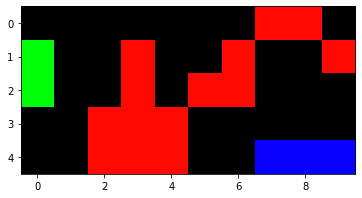

In [6]:
def imshow_components(labels):
    # Map component labels to hue val
    label_hue = np.uint8(179*labels/np.max(labels))
    blank_ch = 255*np.ones_like(label_hue)
    labeled_img = cv2.merge([label_hue, blank_ch, blank_ch])

    # cvt to BGR for display
    labeled_img = cv2.cvtColor(labeled_img, cv2.COLOR_HSV2BGR)

    # set bg label to black
    labeled_img[label_hue==0] = 0

    plt.imshow(labeled_img)

imshow_components(labels)

# Ex2

In [25]:
def quant(X, Q):
    return np.round(X/Q) * Q

In [22]:
def quantiz(signal, partition, codebook):
    indices = []
    quantized = []
    for sig in signal:
        index = 0
        while index < len(partition) and sig > partition[index]:
            index += 1
            
        indices.append(index)
        quantized.append(codebook[index])
    return indices, quantized

In [ ]:
A = np.arange(256)
step = 256/4

In [26]:
QA1 = quant(A, step)
QA1

array([  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
        64.,  64.,  64.,  64.,  64.,  64.,  64.,  64.,  64.,  64.,  64.,
        64.,  64.,  64.,  64.,  64.,  64.,  64.,  64.,  64.,  64.,  64.,
        64.,  64.,  64.,  64.,  64.,  64.,  64.,  64.,  64.,  64.,  64.,
        64.,  64.,  64.,  64.,  64.,  64.,  64.,  64.,  64.,  64.,  64.,
        64.,  64.,  64.,  64.,  64.,  64.,  64.,  64.,  64.,  64.,  64.,
        64.,  64.,  64.,  64.,  64.,  64.,  64.,  64., 128., 128., 128.,
       128., 128., 128., 128., 128., 128., 128., 128., 128., 128., 128.,
       128., 128., 128., 128., 128., 128., 128., 128., 128., 128., 128.,
       128., 128., 128., 128., 128., 128., 128., 128., 128., 128., 128.,
       128., 128., 128., 128., 128., 128., 128., 128., 128., 128., 128.,
       128., 128., 128., 128., 128., 128., 128., 12

In [15]:
partition = np.arange(step, 256-step+1, step)
codebook = np.arange(step/2, 256-step/2+1, step)
indx, QA2 = quantiz(A, partition, codebook)

In [24]:
QA2

[32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 32.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 96.0,
 160.0,
 160.0,
 160.0,
 160.0,
 160.0,
 160.0,
 160.0,
 160.0,
 160.0,
 160.0,
 160.0,
 160.0,
 

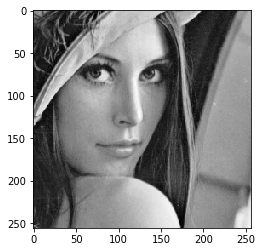

In [39]:
im = cv2.imread("assets/lena_face.png", cv2.IMREAD_GRAYSCALE)
plt.imshow(im, cmap='gray')

In [40]:
im.shape

(256, 256)

In [42]:
im.flatten()

array([138, 140, 134, ..., 221, 221, 218], dtype=uint8)

In [28]:
levels = np.array([128, 64, 32, 16, 8, 4])
steps = 256 / levels
steps

array([ 2.,  4.,  8., 16., 32., 64.])

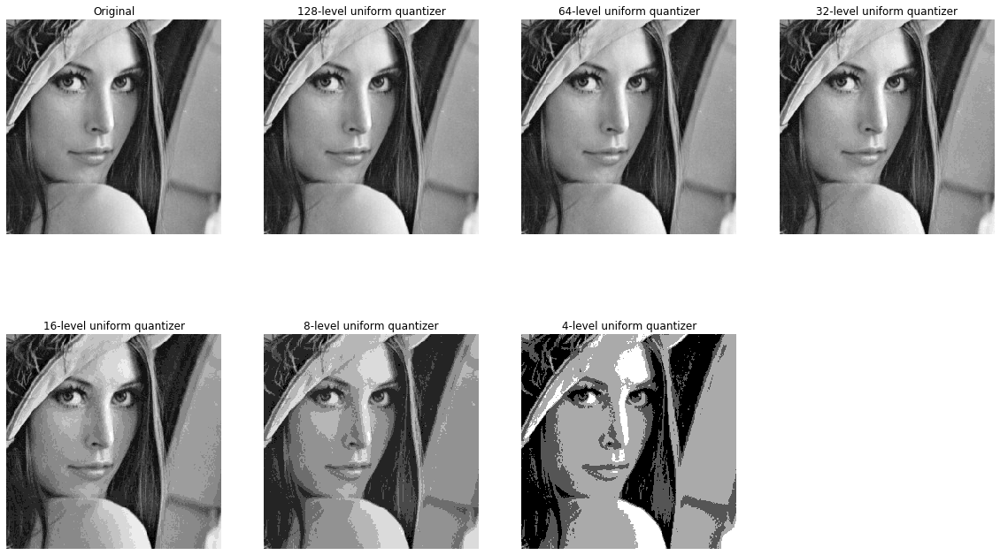

In [68]:
fig = plt.figure(figsize=(20, 12))
ax = fig.add_subplot(2, 4, 1)
ax.imshow(im, cmap='gray')
ax.set_title('Original')
ax.axis('off')
for idx, (level, step) in enumerate(zip(levels, steps)):
    partition = np.arange(step, 256-step+1, step)
    codebook = np.arange(step/2, 256-step/2+1, step)
    _, QI = quantiz(im.ravel(), partition, codebook)
    ax = fig.add_subplot(2, 4, idx+2)
    ax.imshow(np.reshape(QI, im.shape), cmap='gray')
    ax.set_title('{}-level uniform quantizer'.format(level))
    ax.axis('off')

## Add noise to the image before quantization

(-0.5, 255.5, 255.5, -0.5)

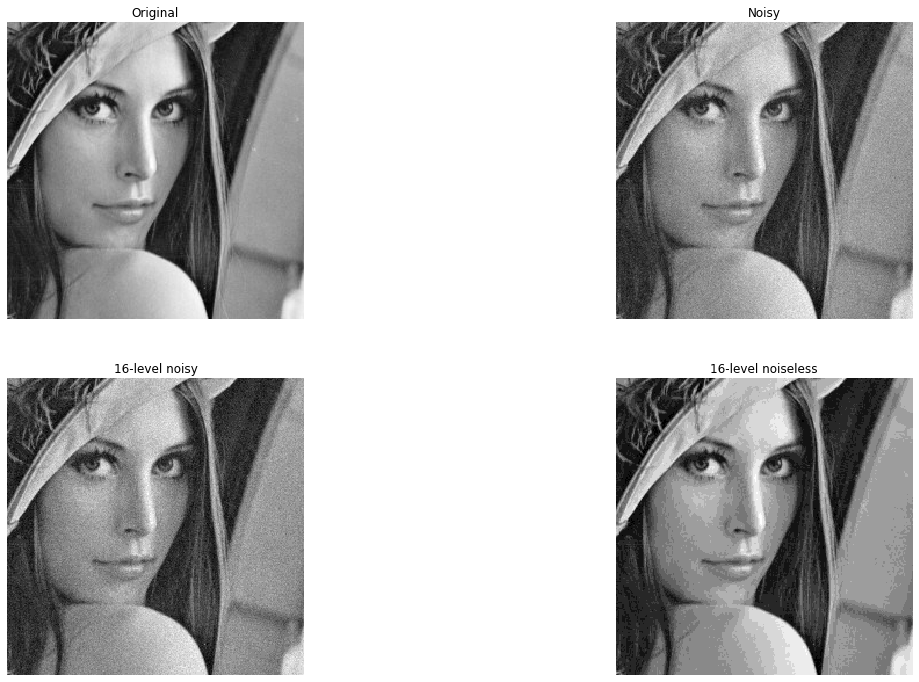

In [67]:
im_noisy = im + 8 * np.random.randn(im.shape[0], im.shape[1])
step = 256/16
partition = np.arange(step, 256-step+1, step)
codebook = np.arange(step/2, 256-step/2+1, step)
_, QI16noisy = quantiz(im_noisy.ravel(), partition, codebook)
_, QI16 = quantiz(im.ravel(), partition, codebook)

fig, ax = plt.subplots(2,2, figsize=(20,12))
ax[0][0].imshow(im, cmap='gray')
ax[0][0].set_title('Original')
ax[0][0].axis('off')

ax[0][1].imshow(im_noisy, cmap='gray')
ax[0][1].set_title('Noisy')
ax[0][1].axis('off')

ax[1][0].imshow(np.reshape(QI16noisy, im.shape), cmap='gray')
ax[1][0].set_title('16-level noisy')
ax[1][0].axis('off')

ax[1][1].imshow(np.reshape(QI16, im.shape), cmap='gray')
ax[1][1].set_title('16-level noiseless')
ax[1][1].axis('off')

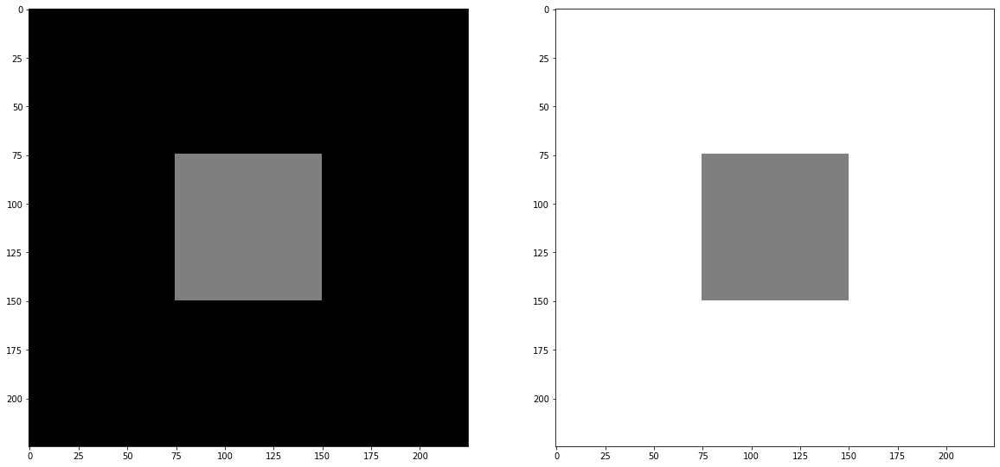

In [94]:
I1 = np.zeros((225, 225), dtype=np.uint8)
I1[75:150, 75:150] = 127

I2 = 255 * np.ones((225, 225), dtype=np.uint8)
I2[75:150, 75:150] = 127

fig, ax = plt.subplots(1,2, figsize=(20, 12))
ax[0].imshow(I1, cmap='gray', vmin=0, vmax=255)
ax[1].imshow(I2, cmap='gray', vmin=0, vmax=255)

# Ex3

## Pixel operation

/Users/hidiryuzuguzel/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  if __name__ == '__main__':


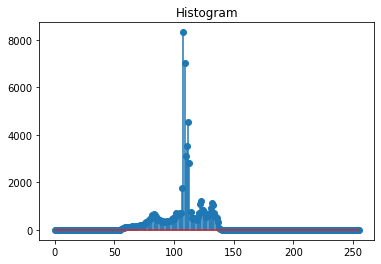

In [75]:
# construct histogram
I = cv2.imread('assets/wom1.PNG', cv2.IMREAD_GRAYSCALE)
H = np.zeros(256)

for i in range(I.shape[0]):
    for j in range(I.shape[1]):
        H[I[i,j]] += 1

plt.stem(H)
plt.title('Histogram');

In [276]:
def ContrastStretch(Iin):
    if np.max(Iin) - np.min(Iin) < 1e-5: # Do-nothing
        Iout = Iin
    else:
        min_img, max_img = np.min(Iin), np.max(Iin)
        Iout = ((Iin - min_img) / (max_img - min_img)) * 255

    return Iout

(-0.5, 255.5, 255.5, -0.5)

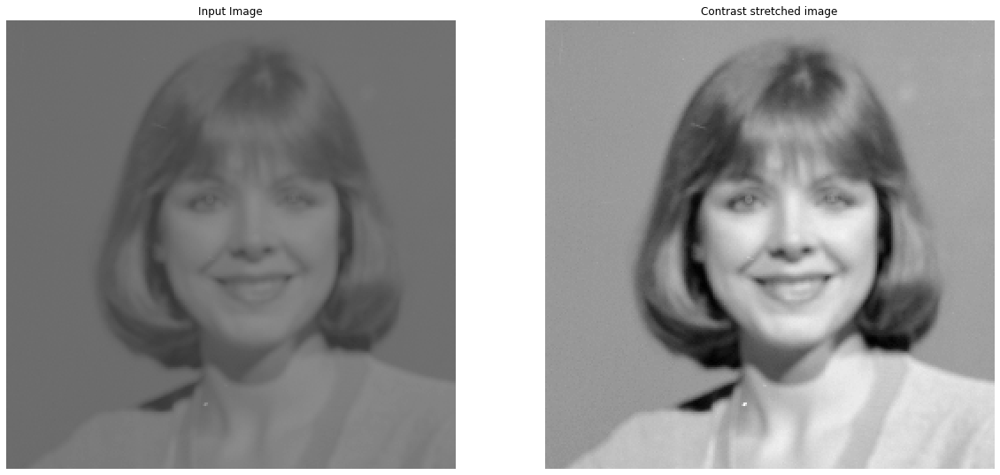

In [93]:
# contrast stretching
Ib = ContrastStretch(I)
fig, ax = plt.subplots(1,2, figsize=(20, 12))
ax[0].imshow(I, cmap='gray', vmin=0, vmax=255)
ax[0].set_title('Input Image')
ax[0].axis('off')
ax[1].imshow(Ib.astype(np.uint8),  cmap='gray', vmin=0, vmax=255)
ax[1].set_title('Contrast stretched image')
ax[1].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/Users/hidiryuzuguzel/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:28: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.


(-12.75, 267.75, -368.05, 7729.05)

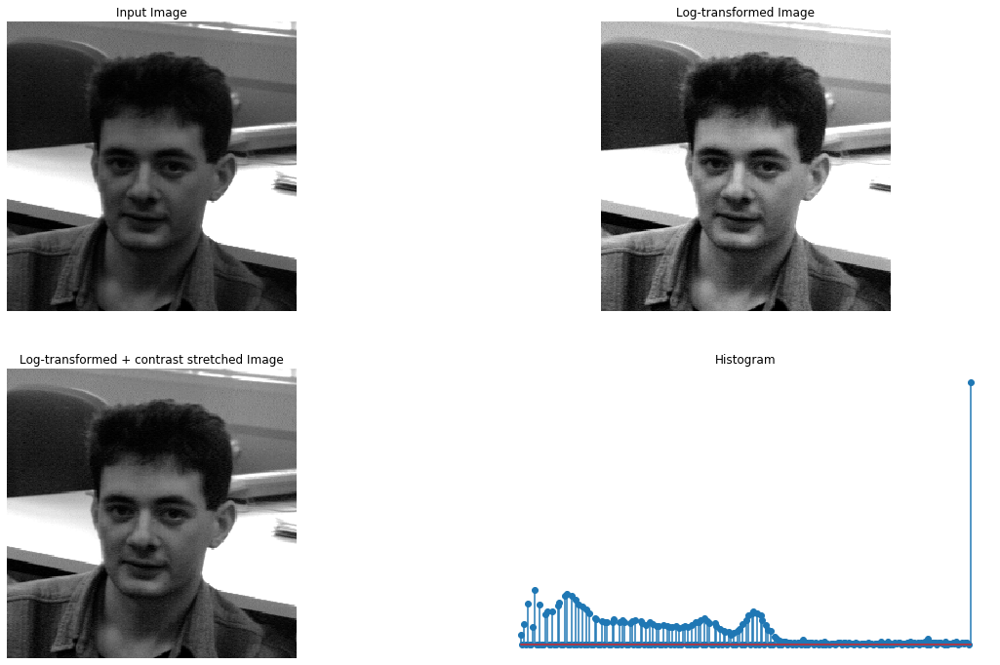

In [280]:
# Log-transform
Iman = plt.imread('assets/man8.PNG')
c = 2  # constant
I1 = c * np.log(1 + Iman) # log-transformation applied
I2 = ContrastStretch(I1)
I2 = I2.astype(np.uint8)

H = np.zeros(256)

for i in range(I2.shape[0]):
    for j in range(I2.shape[1]):
        H[I2[i,j]] += 1
        
fig, ax = plt.subplots(2,2, figsize=(20, 12))
ax[0][0].imshow(Iman, cmap='gray', vmin=0, vmax=255)
ax[0][0].set_title('Input Image')
ax[0][0].axis('off')

ax[0][1].imshow(I1, cmap='gray', vmin=0, vmax=255)
ax[0][1].set_title('Log-transformed Image')
ax[0][1].axis('off')

ax[1][0].imshow(I2, cmap='gray', vmin=0, vmax=255)
ax[1][0].set_title('Log-transformed + contrast stretched Image')
ax[1][0].axis('off')

ax[1][1].stem(H)
ax[1][1].set_title('Histogram')
ax[1][1].axis('off')

## Downsampling

In [8]:
I = plt.imread('assets/mbaboon.bmp')
Ia = I[1:-1:4, 1:-1:4]
Ib = I[::4, ::4]
Ic = np.zeros((64, 64))
for i in range(I.shape[0]):
    for j in range(I.shape[1]):
        x = int(np.floor(i/4))
        y = int(np.floor(j/4))
        Is = I[i:i+4, j:j+4]
        Ic[x,y] = np.mean(Is.ravel())

(-0.5, 63.5, 63.5, -0.5)

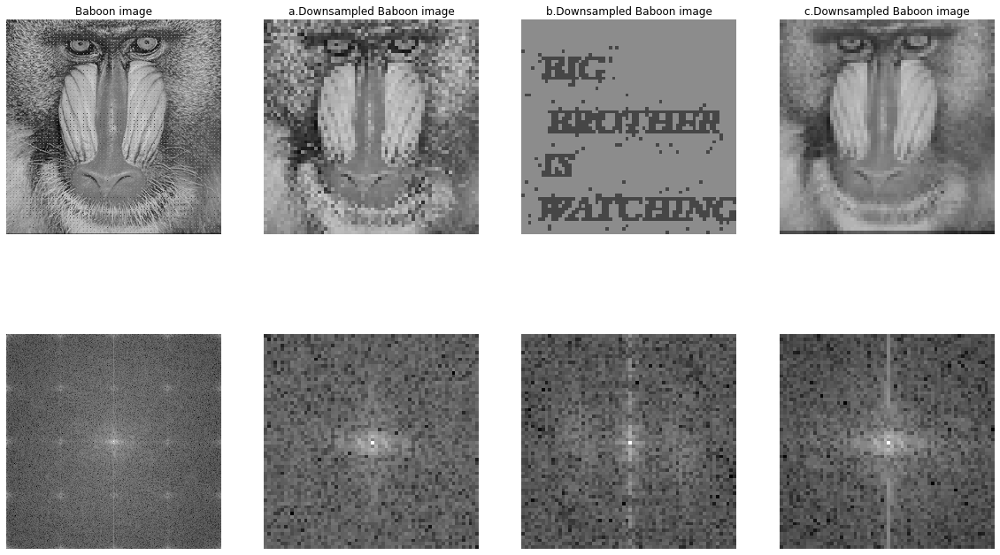

In [16]:
fig, ax = plt.subplots(2,4, figsize=(20, 12))
ax[0][0].imshow(I, cmap='gray', vmin=0, vmax=255)
ax[0][0].set_title('Baboon image')
ax[0][0].axis('off')

ax[0][1].imshow(Ia, cmap='gray', vmin=0, vmax=255)
ax[0][1].set_title('a.Downsampled Baboon image')
ax[0][1].axis('off')

ax[0][2].imshow(Ib, cmap='gray', vmin=0, vmax=255)
ax[0][2].set_title('b.Downsampled Baboon image')
ax[0][2].axis('off')

ax[0][3].imshow(Ic, cmap='gray', vmin=0, vmax=255)
ax[0][3].set_title('c.Downsampled Baboon image')
ax[0][3].axis('off')
 
ax[1][0].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(I))) + 0.0001), cmap='gray')
ax[1][0].axis('off')

ax[1][1].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(Ia))) + 0.0001), cmap='gray')
ax[1][1].axis('off')

ax[1][2].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(Ib))) + 0.0001), cmap='gray')
ax[1][2].axis('off')

ax[1][3].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(Ic))) + 0.0001), cmap='gray')
ax[1][3].axis('off')

# Ex4

## Image Enhancement Intensity Transformations
- log transformation: expand the values of dark pixels in an image while compressing the higher level values
- power-law transformation: more versatile than log-transformation

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'power-transformation')

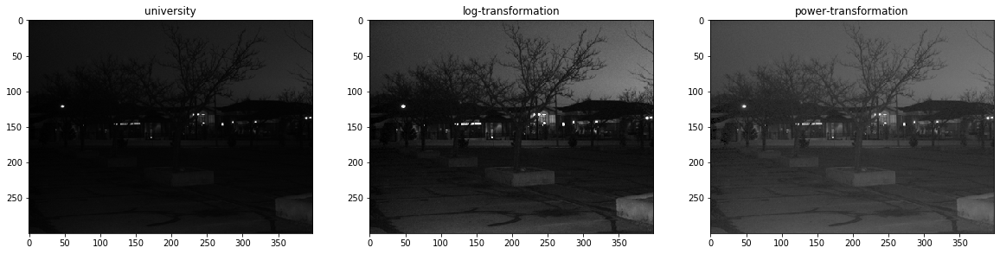

In [312]:
I = plt.imread('assets/university.png')

c1 = 3
I1 = c1 * np.log(1+I)
c2 = 1
gamma = 1/2.2
I2 = c2 * I**gamma

fig, ax = plt.subplots(1,3, figsize=(20, 12))
ax[0].imshow(I, cmap='gray', vmin=0, vmax=1)
ax[0].set_title('university')
ax[1].imshow(I1, cmap='gray', vmin=0, vmax=1)
ax[1].set_title('log-transformation')
ax[2].imshow(I2, cmap='gray', vmin=0, vmax=1)
ax[2].set_title('power-transformation')

## Histogram Equalization

In [57]:
def histequal(im_in, H=None):
    
    im_out = np.zeros_like(im_in)
    
    if H is None:
        H = np.zeros(256) # histogram
        d = 1/im_in.size
        for i in range(im_in.shape[0]):
            for j in range(im_in.shape[1]):
                H[im_in[i,j]] += d
            
    # build LUT
    mysum = np.cumsum(H)
    lookup = np.floor(mysum*255 + 0.5)
    
    # image mapping
    for i in range(im_in.shape[0]):
        for j in range(im_in.shape[1]):
            im_out[i, j] = lookup[im_in[i,j]]
            
    return im_out.astype(np.uint8)

In [45]:
def ContrastStretch1(im, lo, hi):
    im = im.astype(np.float64)
    immax = np.max(im.ravel())
    immin = np.min(im.ravel())
    im1 = (im - immin)*(hi-lo)/(immax-immin) + lo
    return im1.astype(np.uint8)

In [30]:
im_moon = cv2.imread('assets/moon.png', cv2.IMREAD_GRAYSCALE)
im_house = cv2.imread('assets/house.png', cv2.IMREAD_GRAYSCALE)
im_spine = cv2.imread('assets/spine.jpg', cv2.IMREAD_GRAYSCALE)
im_church = cv2.imread('assets/church.png', cv2.IMREAD_GRAYSCALE)

In [54]:
im_moon_histeq = histequal(im_moon) #cv2.equalizeHist(im_moon)
im_house_histeq = histequal(im_house) #cv2.equalizeHist(im_house)
im_spine_histeq = histequal(im_spine) #cv2.equalizeHist(im_spine)
im_church_histeq = histequal(im_church) #cv2.equalizeHist(im_church)

im_moon_contstr = ContrastStretch1(im_moon, 0, 255)
im_house_contstr = ContrastStretch1(im_house, 0, 255)
im_spine_contstr = ContrastStretch1(im_spine, 0, 255)
im_church_contstr = ContrastStretch1(im_church, 0, 255)

Text(0.5, 1.0, 'contrast stretching')

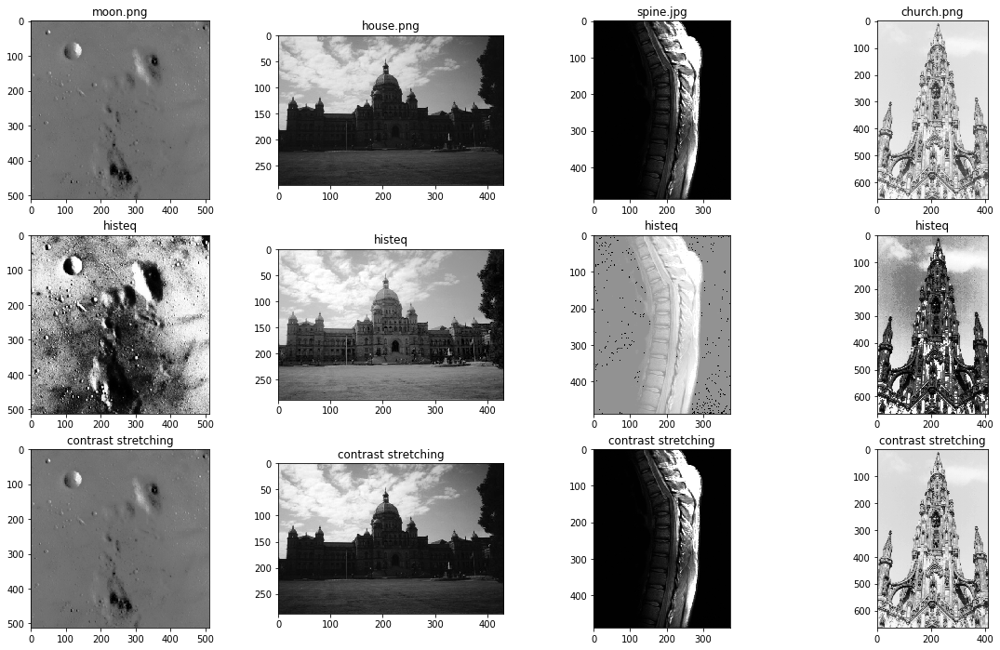

In [55]:
fig, ax = plt.subplots(3,4, figsize=(20,12))
ax[0][0].imshow(im_moon, cmap='gray', vmin=0, vmax=255)
ax[0][0].set_title('moon.png')
ax[0][1].imshow(im_house, cmap='gray', vmin=0, vmax=255)
ax[0][1].set_title('house.png')
ax[0][2].imshow(im_spine, cmap='gray', vmin=0, vmax=255)
ax[0][2].set_title('spine.jpg')
ax[0][3].imshow(im_church, cmap='gray', vmin=0, vmax=255)
ax[0][3].set_title('church.png')

ax[1][0].imshow(im_moon_histeq, cmap='gray', vmin=0, vmax=255)
ax[1][0].set_title('histeq')
ax[1][1].imshow(im_house_histeq, cmap='gray', vmin=0, vmax=255)
ax[1][1].set_title('histeq')
ax[1][2].imshow(im_spine_histeq, cmap='gray', vmin=0, vmax=255)
ax[1][2].set_title('histeq')
ax[1][3].imshow(im_church_histeq, cmap='gray', vmin=0, vmax=255)
ax[1][3].set_title('histeq')

ax[2][0].imshow(im_moon_contstr, cmap='gray', vmin=0, vmax=255)
ax[2][0].set_title('contrast stretching')
ax[2][1].imshow(im_house_contstr, cmap='gray', vmin=0, vmax=255)
ax[2][1].set_title('contrast stretching')
ax[2][2].imshow(im_spine_contstr, cmap='gray', vmin=0, vmax=255)
ax[2][2].set_title('contrast stretching')
ax[2][3].imshow(im_church_contstr, cmap='gray', vmin=0, vmax=255)
ax[2][3].set_title('contrast stretching')

## Use image corel.png to histogram equalize church.png

Text(0.5, 1.0, 'histeq with corel histogram')

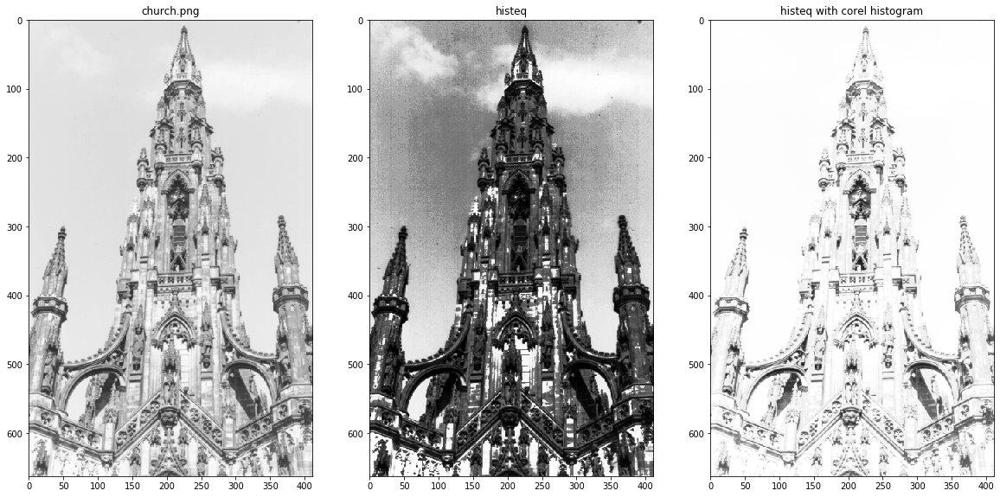

In [319]:
im_church = cv2.imread('assets/church.png', cv2.IMREAD_GRAYSCALE)
im_corel = cv2.imread('assets/corel.png', cv2.IMREAD_GRAYSCALE)

im_church_histeq = histequal(im_church)
Hcorel = np.zeros(256) # histogram
d = 1 / im_corel.size
for i in range(im_corel.shape[0]):
    for j in range(im_corel.shape[1]):
        Hcorel[im_corel[i,j]] += d
        
im_church_histeq_with_corel = histequal(im_church, Hcorel)

fig, ax = plt.subplots(1,3, figsize=(20, 12))
ax[0].imshow(im_church, cmap='gray', vmin=0, vmax=255)
ax[0].set_title('church.png')
ax[1].imshow(im_church_histeq, cmap='gray', vmin=0, vmax=255)
ax[1].set_title('histeq')
ax[2].imshow(im_church_histeq_with_corel, cmap='gray', vmin=0, vmax=255)
ax[2].set_title('histeq with corel histogram')

## Histogram Matching

In [68]:
ImA = cv2.imread('assets/corel.png', cv2.IMREAD_GRAYSCALE) # reference
ImB = cv2.imread('assets/church.png', cv2.IMREAD_GRAYSCALE) # target

In [78]:
HA, _ = np.histogram(ImA.ravel(), bins=256, range=(-0.5, 255.5), density=True)
HB, _ = np.histogram(ImB.ravel(), bins=256, range=(-0.5, 255.5), density=True)

In [79]:
F1 = np.cumsum(HA)
F2 = np.cumsum(HB)
M = np.zeros(256)
for i in range(256):
    idx = np.argmin(np.abs(F2 - F1[i]))
    M[i] = idx - 1
    
Im_out = M[ImA]

Text(0.5, 1.0, 'histmatch')

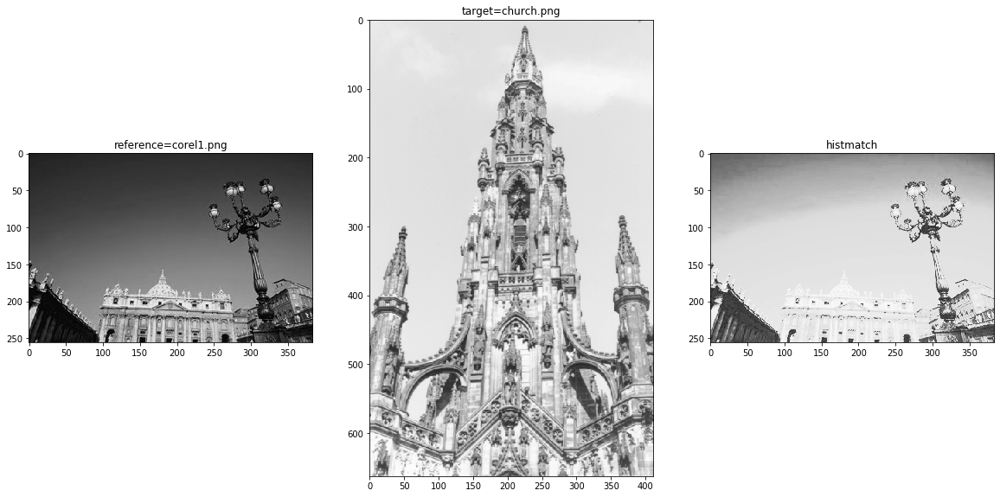

In [81]:
fig, ax = plt.subplots(1,3, figsize=(20, 12))
ax[0].imshow(ImA, cmap='gray', vmin=0, vmax=255)
ax[0].set_title('reference=corel1.png')
ax[1].imshow(ImB, cmap='gray', vmin=0, vmax=255)
ax[1].set_title('target=church.png')
ax[2].imshow(Im_out, cmap='gray', vmin=0, vmax=255)
ax[2].set_title('histmatch')

# Ex5

## Laplacian filter with high-boost filtering

In [258]:
I = plt.imread('assets/cameraman.png')

In [259]:
Laplacian_Kernels = -1 * np.ones((3,3,3))
Laplacian_Kernels[0,1,1] = 8
Laplacian_Kernels[1,1,1] = 9
Laplacian_Kernels[2,1,1] = 9.7

In [260]:
Laplacian_Kernels[1,...]

array([[-1., -1., -1.],
       [-1.,  9., -1.],
       [-1., -1., -1.]])

In [263]:
#I1 = cv2.filter2D(I, -1, Laplacian_Kernels[0,...], None, None, cv2.BORDER_REPLICATE)
#I2 = cv2.filter2D(I, -1, Laplacian_Kernels[1,...], None, None, cv2.BORDER_REPLICATE)
#I3 = cv2.filter2D(I, -1, Laplacian_Kernels[2,...], None, None, cv2.BORDER_REPLICATE)

In [264]:
I1 = ndimage.convolve(I, Laplacian_Kernels[0,...], mode='nearest')
I2 = ndimage.convolve(I, Laplacian_Kernels[1,...], mode='nearest')
I3 = ndimage.convolve(I, Laplacian_Kernels[2,...], mode='nearest')

Text(0.5, 1.0, 'Laplacian kernel A=9.7')

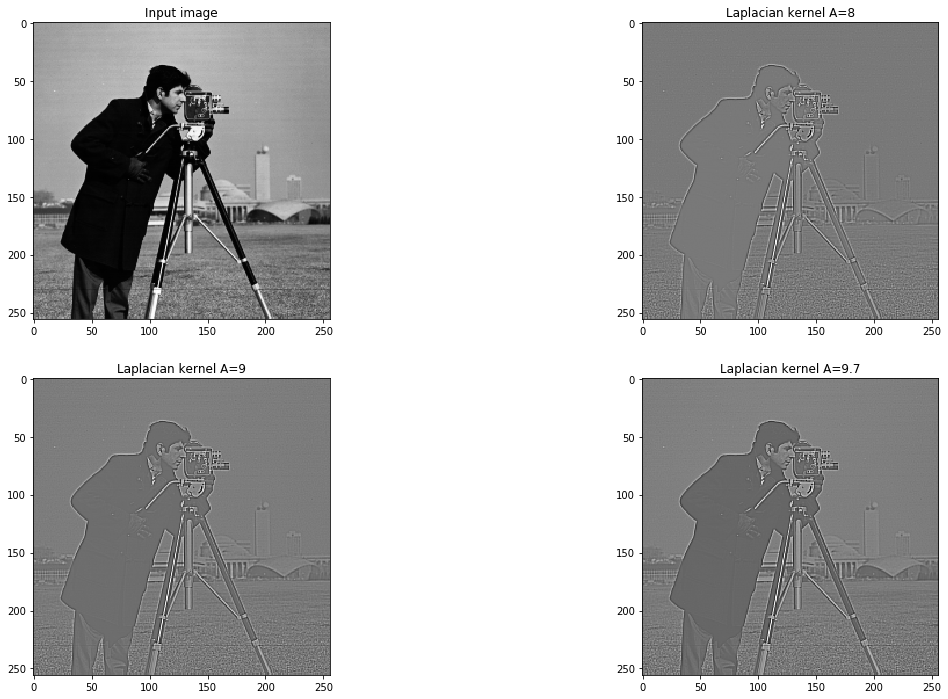

In [265]:
fig, ax = plt.subplots(2,2, figsize=(20,12))
ax[0][0].imshow(I, cmap='gray')
ax[0][0].set_title('Input image')
ax[0][1].imshow(I1, cmap='gray')
ax[0][1].set_title('Laplacian kernel A=8')
ax[1][0].imshow(I2, cmap='gray')
ax[1][0].set_title('Laplacian kernel A=9')
ax[1][1].imshow(I3, cmap='gray')
ax[1][1].set_title('Laplacian kernel A=9.7')

## Directional filtering

In [145]:
def direct_filter(dim):
    kernel = np.zeros((4, dim, dim))
    kernel[0, int((dim-1)/2), :] = 1/3
    for k in range(1,4):
        kernel[k, :, :] = ndimage.rotate(kernel[0,...],45*k, order=0, prefilter=False, reshape=False, mode='nearest')
        
    return kernel

Text(0.5, 1.0, 'Noisy input image')

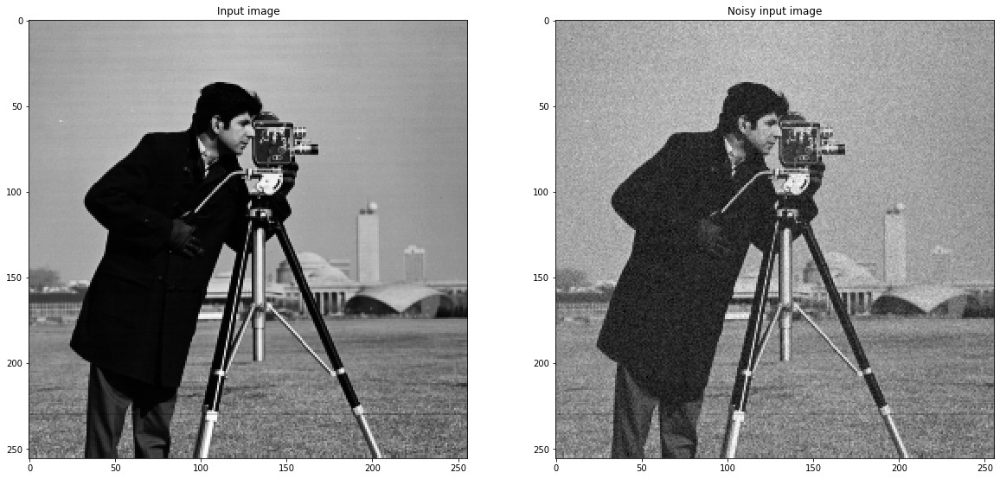

In [266]:
I = plt.imread('assets/cameraman.png')

sigma = 10
Inoisy = I + (sigma/255) * np.random.randn(I.shape[0], I.shape[1])

fig, ax = plt.subplots(1, 2, figsize=(20,12))
ax[0].imshow(I, cmap='gray')
ax[0].set_title('Input image')
ax[1].imshow(Inoisy, cmap='gray')
ax[1].set_title('Noisy input image')

In [148]:
kernel3 = direct_filter(3)
kernel5 = direct_filter(5)
kernel7 = direct_filter(7)

In [150]:
I3_0 = ndimage.convolve(Inoisy, kernel3[0,...], mode='nearest')
I3_45 = ndimage.convolve(Inoisy, kernel3[1,...], mode='nearest')
I3_90 = ndimage.convolve(Inoisy, kernel3[2,...], mode='nearest')
I3_135 = ndimage.convolve(Inoisy, kernel3[3,...], mode='nearest')

I5_0 = ndimage.convolve(Inoisy, kernel5[0,...], mode='nearest')
I5_45 = ndimage.convolve(Inoisy, kernel5[1,...], mode='nearest')
I5_90 = ndimage.convolve(Inoisy, kernel5[2,...], mode='nearest')
I5_135 = ndimage.convolve(Inoisy, kernel5[3,...], mode='nearest')

I7_0 = ndimage.convolve(Inoisy, kernel7[0,...], mode='nearest')
I7_45 = ndimage.convolve(Inoisy, kernel7[1,...], mode='nearest')
I7_90 = ndimage.convolve(Inoisy, kernel7[2,...], mode='nearest')
I7_135 = ndimage.convolve(Inoisy, kernel7[3,...], mode='nearest')

Text(0.5, 1.0, 'kernel_size=7 & 135 degree')

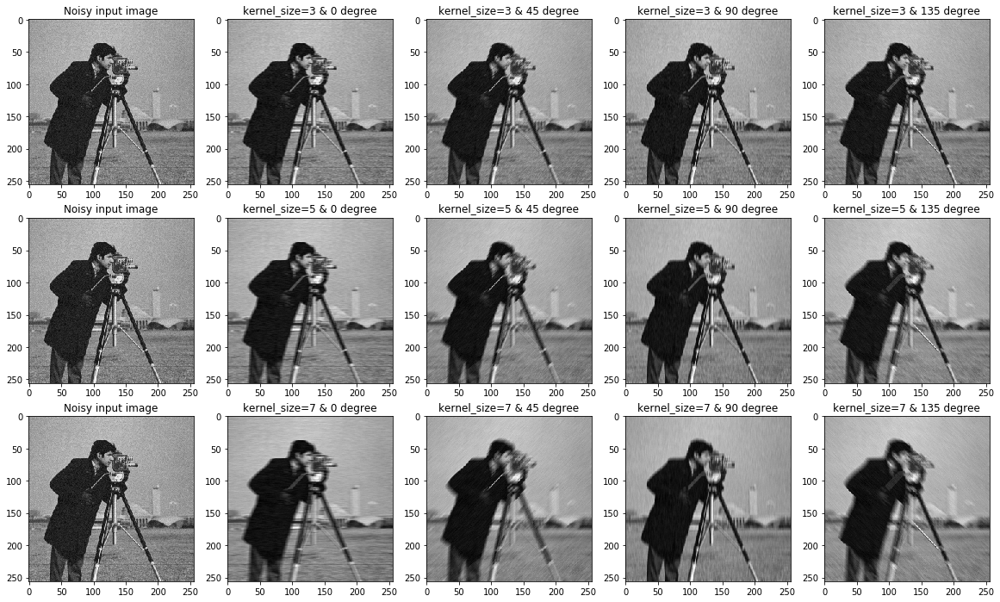

In [153]:
fig, ax = plt.subplots(3, 5, figsize=(20,12))

ax[0][0].imshow(Inoisy, cmap='gray')
ax[0][0].set_title('Noisy input image')
ax[0][1].imshow(I3_0, cmap='gray')
ax[0][1].set_title('kernel_size=3 & 0 degree')
ax[0][2].imshow(I3_45, cmap='gray')
ax[0][2].set_title('kernel_size=3 & 45 degree')
ax[0][3].imshow(I3_90, cmap='gray')
ax[0][3].set_title('kernel_size=3 & 90 degree')
ax[0][4].imshow(I3_135, cmap='gray')
ax[0][4].set_title('kernel_size=3 & 135 degree')

ax[1][0].imshow(Inoisy, cmap='gray')
ax[1][0].set_title('Noisy input image')
ax[1][1].imshow(I5_0, cmap='gray')
ax[1][1].set_title('kernel_size=5 & 0 degree')
ax[1][2].imshow(I5_45, cmap='gray')
ax[1][2].set_title('kernel_size=5 & 45 degree')
ax[1][3].imshow(I5_90, cmap='gray')
ax[1][3].set_title('kernel_size=5 & 90 degree')
ax[1][4].imshow(I5_135, cmap='gray')
ax[1][4].set_title('kernel_size=5 & 135 degree')

ax[2][0].imshow(Inoisy, cmap='gray')
ax[2][0].set_title('Noisy input image')
ax[2][1].imshow(I7_0, cmap='gray')
ax[2][1].set_title('kernel_size=7 & 0 degree')
ax[2][2].imshow(I7_45, cmap='gray')
ax[2][2].set_title('kernel_size=7 & 45 degree')
ax[2][3].imshow(I7_90, cmap='gray')
ax[2][3].set_title('kernel_size=7 & 90 degree')
ax[2][4].imshow(I7_135, cmap='gray')
ax[2][4].set_title('kernel_size=7 & 135 degree')

Form the output image as an average of the four filter images:

Text(0.5, 1.0, 'Avg. image dim=7')

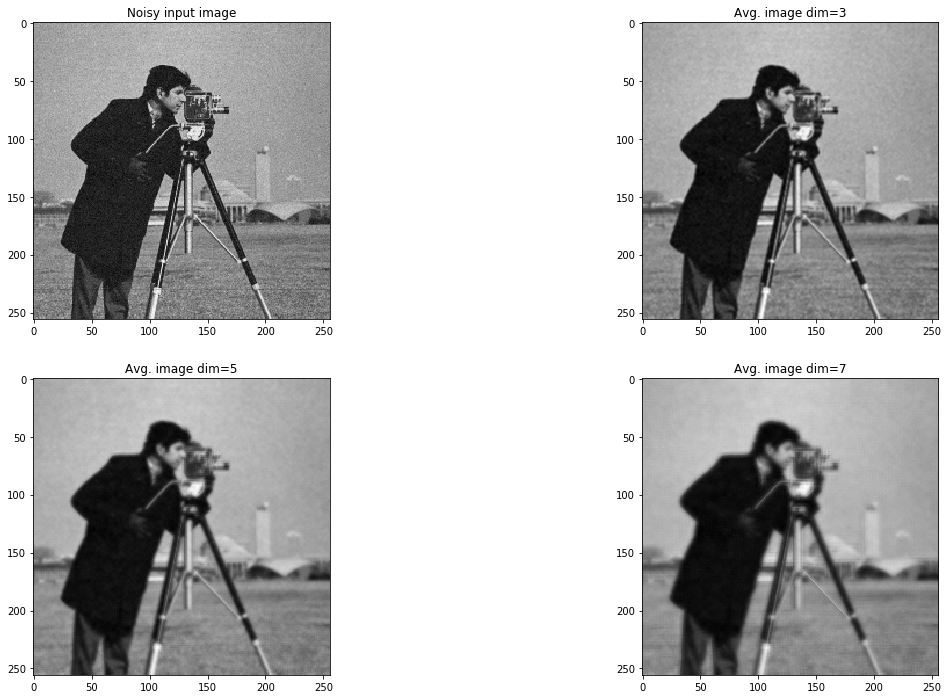

In [154]:
I3_avg = (I3_0 + I3_45 + I3_90 + I3_135) / 4
I5_avg = (I5_0 + I5_45 + I5_90 + I5_135) / 4
I7_avg = (I7_0 + I7_45 + I7_90 + I7_135) / 4

fig, ax = plt.subplots(2, 2, figsize=(20, 12))
ax[0][0].imshow(Inoisy, cmap='gray')
ax[0][0].set_title('Noisy input image')
ax[0][1].imshow(I3_avg, cmap='gray')
ax[0][1].set_title('Avg. image dim=3')
ax[1][0].imshow(I5_avg, cmap='gray')
ax[1][0].set_title('Avg. image dim=5')
ax[1][1].imshow(I7_avg, cmap='gray')
ax[1][1].set_title('Avg. image dim=7')


## Threshold Median Filtering an Image

Text(0.5, 1.0, 'Median filtered image')

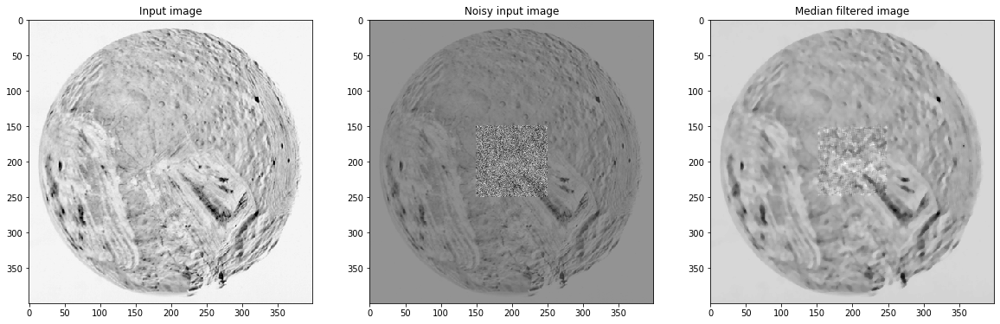

In [271]:
I = plt.imread('assets/miranda1.tif') / 255

Inoisy = I.copy()
sigma = 50
Inoisy[150:250, 150:250] += (sigma/255) * np.random.randn(100, 100)

Imed = ndimage.median_filter(Inoisy, (5,5), mode='nearest')

fig, ax = plt.subplots(1, 3, figsize=(20,12))
ax[0].imshow(I, cmap='gray')
ax[0].set_title('Input image')
ax[1].imshow(Inoisy, cmap='gray')
ax[1].set_title('Noisy input image')
ax[2].imshow(Imed, cmap='gray')
ax[2].set_title('Median filtered image')

# Ex 6

## DFT of Images
DFT decomposes an image signal into sines and cosines components. It transforms an image from spatial domain
to frequency domain. DFT tells us about geometric structure of the image. For example, it gives us an idea of low
and high frequency components of the image. Since typical images have much stronger low frequency content, most
of the information lies in the center of the DFT image

In [177]:
dft2d = lambda X: np.fft.fftshift(np.fft.fft2(X))

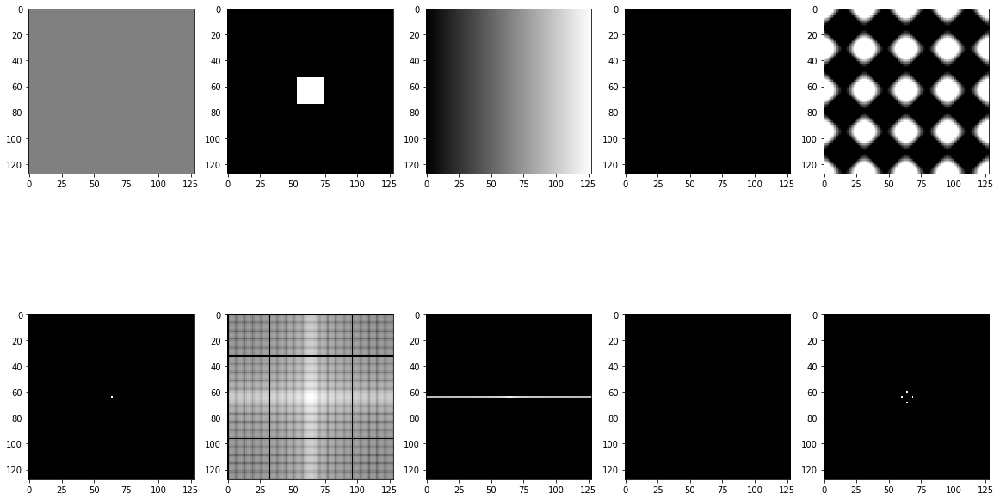

In [198]:
# Constant value 0.5 for whole image
Ia = 0.5 * np.ones((128, 128))
Fa = dft2d(Ia)

# 20x20 white square in the middle
Ib = np.zeros((128, 128))
Ib[54:74, 54:74] = 1
Fb = dft2d(Ib)

# Ramp from 0 to 1 in one direction, constant in the other
rmp = np.linspace(0, 1, 128)
Ic = np.tile(rmp, (128,1))
Fc = dft2d(Ic)

# Delta function at the center of the image
Id = np.zeros((128, 128))
Id[0,0] = 1
Fd = dft2d(Id)

# Cosine image having four period in both directions
X, Y = np.meshgrid(np.arange(1, 129), np.arange(1,129))
period = 32
Ie = np.cos(2*np.pi/period*X.T) + np.cos(2*np.pi/period*Y.T)
Fe = dft2d(Ie)


fig, ax = plt.subplots(2,5, figsize=(20,12))
ax[0][0].imshow(Ia, cmap='gray', vmin=0, vmax=1)
ax[1][0].imshow(np.log(np.abs(Fa)+0.0001), cmap='gray')

ax[0][1].imshow(Ib, cmap='gray', vmin=0, vmax=1)
ax[1][1].imshow(np.log(np.abs(Fb)+0.0001), cmap='gray')

ax[0][2].imshow(Ic, cmap='gray', vmin=0, vmax=1)
ax[1][2].imshow(np.log(np.abs(Fc)+0.0001), cmap='gray')

ax[0][3].imshow(Id, cmap='gray', vmin=0, vmax=1)
ax[1][3].imshow(np.log(np.abs(Fd)+0.0001), cmap='gray')

ax[0][4].imshow(Ie, cmap='gray', vmin=0, vmax=1)
ax[1][4].imshow(np.log(np.abs(Fe)+0.0001), cmap='gray')

1. Since the image signal in the 1st row is constant, the DFT contains a delta function at the center. Thus, the energy
is concentrated at the center of the DFT image.
2. The energy of image signal in the 2nd row is both concentrated at the center and horizontal/vertical directions (2-D sinc in the DFT domain). The reason for this is that there is a square white rectangle in the spatial domain
3. The energy of image signal in the 3rd row is in a narrow band in horizontal direction. Because, the original image is
ramp function in horizontal direction.
5. The energy of image signal in 5th row is located at 4 points. Since the input image is a cosine having periods in
both directions, we observe peak in both directions in the frequency domain.

## Filtering in Frequency Domain

In [201]:
def BWLPfilter(image, cutoff, n):
    """Construct a low-pass butterworth filter"""
    rows, cols = np.shape(image)
    [u,v] = np.meshgrid(np.arange(1,cols+1), np.arange(1,rows+1))
    D = np.sqrt((u-cols/2)**2 + (v-rows/2)**2)
    f = 1 / (1+((D/cutoff)**(2*n)))
    return f

Text(0.5, 1.0, 'filtered image')

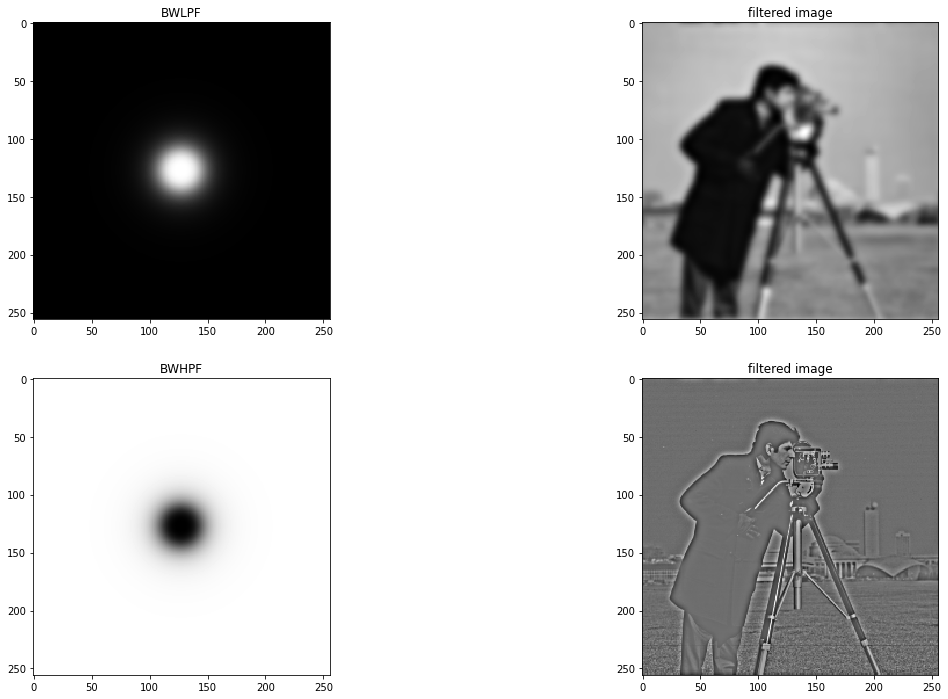

In [339]:
I = plt.imread('assets/cameraman.png')

IF = dft2d(I)
D0 = 20 # cut-off freq.
n = 2   # order

BWLPF = BWLPfilter(I, D0, n)
BWHPF = 1 - BWLPF

ILPF = np.real(np.fft.ifft2(np.fft.ifftshift(BWLPF * IF)))
IHPF = np.real(np.fft.ifft2(np.fft.ifftshift(BWHPF * IF)))

fig, ax = plt.subplots(2,2, figsize=(20,12))
ax[0][0].imshow(BWLPF, cmap='gray')
ax[0][0].set_title('BWLPF')
ax[0][1].imshow(ILPF, cmap='gray')
ax[0][1].set_title('filtered image')

ax[1][0].imshow(BWHPF, cmap='gray')
ax[1][0].set_title('BWHPF')
ax[1][1].imshow(IHPF, cmap='gray')
ax[1][1].set_title('filtered image')

## Discrete Cosine Transform Matrix

In [209]:
dctmtx = lambda N: fftpack.dct(np.eye(N), norm='ortho', axis=0)

Text(0.5, 0.98, 'DCT8 Basis Images')

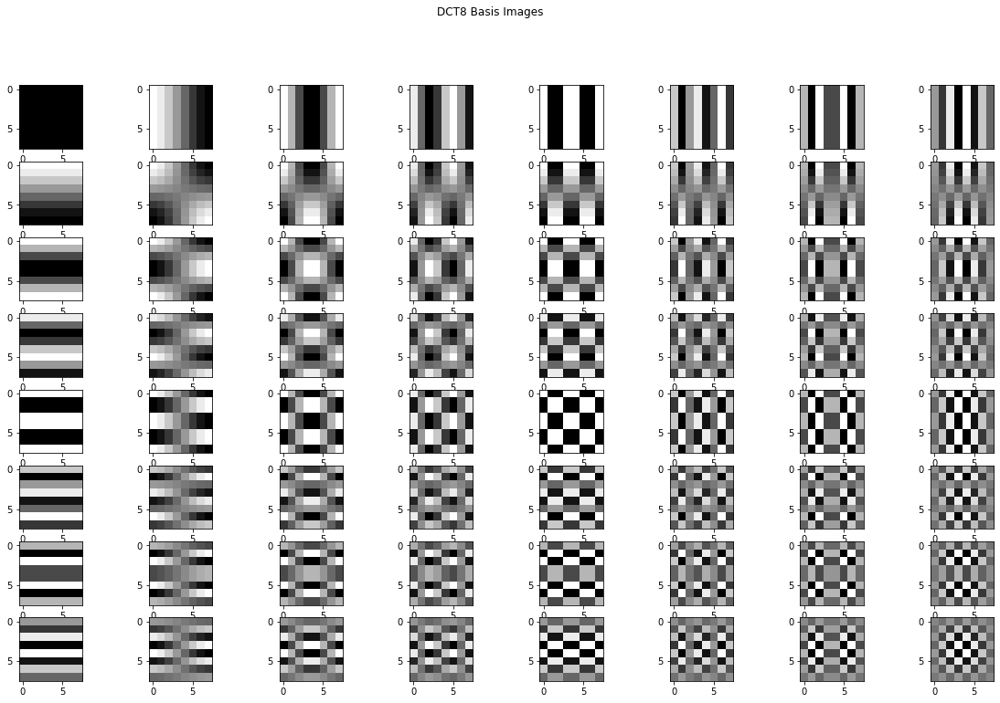

In [225]:
DCT8 = dctmtx(8)

fig, ax = plt.subplots(8,8, figsize=(20,12))
for i in range(8):
    for j in range(8):
        ax[i][j].imshow(np.outer(DCT8[i,:], DCT8[j,:]), cmap='gray')
fig.suptitle('DCT8 Basis Images')

Text(0.5, 0.98, 'DCT16 Basis Images')

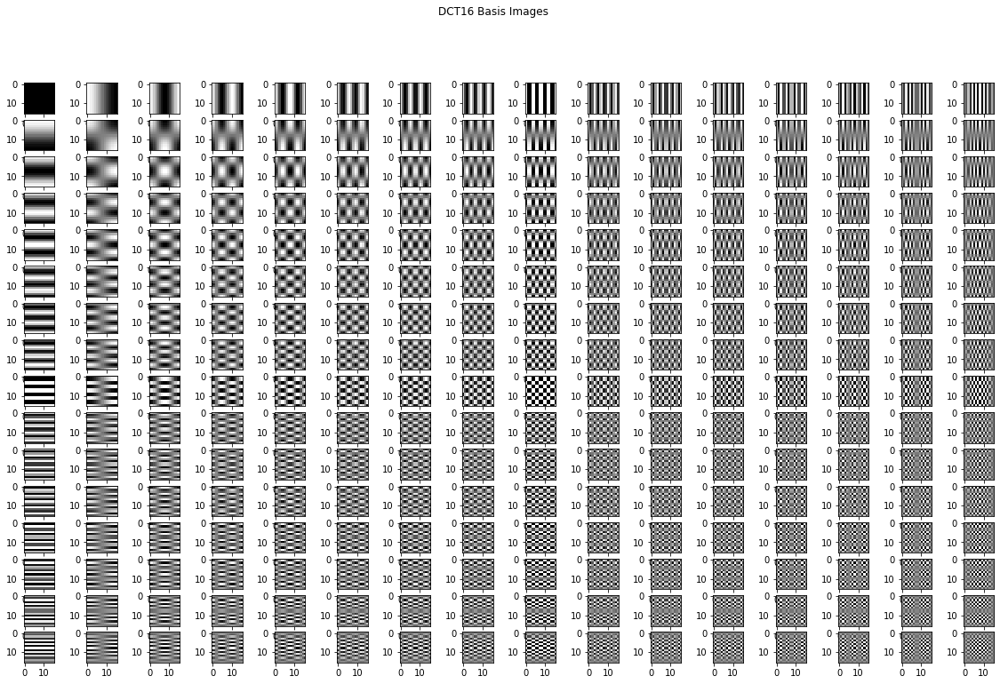

In [227]:
DCT16 = dctmtx(16)

fig, ax = plt.subplots(16,16, figsize=(20,12))
for i in range(16):
    for j in range(16):
        ax[i][j].imshow(np.outer(DCT16[i, :], DCT16[j, :]), cmap='gray')
fig.suptitle('DCT16 Basis Images')

# Ex7 

## Compression with DFT, DCT, Haar and Walsh-Hadamard Transforms

In [340]:
dct2d = lambda x: fftpack.dct(fftpack.dct(x, norm='ortho').T, norm='ortho').T
idct2d = lambda x: fftpack.idct(fftpack.idct(x, norm='ortho').T, norm='ortho').T

In [335]:
im = plt.imread('assets/cameraman.png')

I_DFT = dft2d(im)
I_DCT = dct2d(im)

Out of both transform, select only a quarter of coefficients (i.e. continuous square section) so they contain most of the image energy. 

In [332]:
I_DFT_new = np.zeros_like(I_DFT)
I_DFT_new[64:64+128, 64:64+128] = I_DFT[64:64+128, 64:64+128]
I_DCT_new = np.zeros_like(I_DCT)
I_DCT_new[:128, :128] = I_DCT[:128, :128]

In [ ]:
fig, ax = plt.subplots(2, 2, figsize=(20,12))
ax[0][0].imshow(np.log(np.abs(I_DFT) + 0.0001), cmap='gray')
ax[0][0].set_title('DFT')

ax[0][1].imshow(np.log(np.abs(I_DCT) + 0.0001), cmap='gray')
ax[0][1].set_title('DCT')

ax[1][0].imshow(np.log(np.abs(I_DFT_new) + 0.0001), cmap='gray')
ax[1][0].set_title('DFT_new')

ax[1][1].imshow(np.log(np.abs(I_DCT_new) + 0.0001), cmap='gray')
ax[1][1].set_title('DCT_new')

Reconstruct the images using the inverse transform.

In [341]:
I_DFT_reconst = np.real(np.fft.ifft2(np.fft.ifftshift(I_DFT_new)))
I_DCT_reconst = idct2d(I_DCT_new)

Text(0.5, 1.0, 'DCT reconstruct')

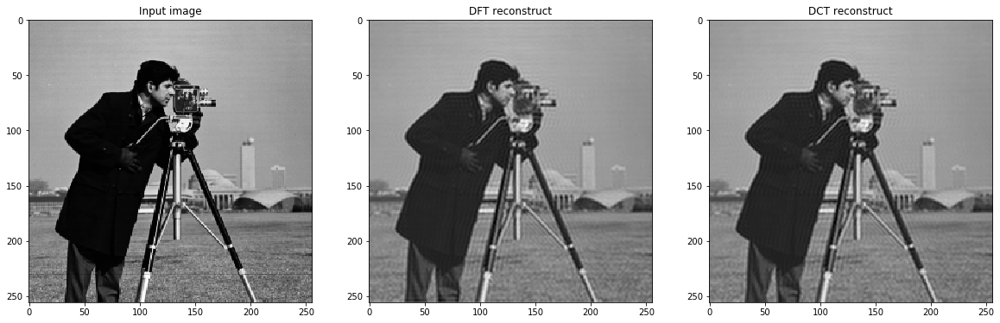

In [345]:
fig, ax = plt.subplots(1, 3, figsize=(20,12))
ax[0].imshow(im, cmap='gray')
ax[0].set_title('Input image')
ax[1].imshow(I_DFT_reconst, cmap='gray')
ax[1].set_title('DFT reconstruct')
ax[2].imshow(I_DCT_reconst, cmap='gray')
ax[2].set_title('DCT reconstruct')

Finally, compute the mean squared error between the reconstructed images and the original.

In [346]:
DFT_mse = np.mean((im.ravel()-I_DFT_reconst.ravel())**2)
DFT_mse

0.0018511417

In [347]:
DCT_mse = np.mean((im.ravel()-I_DCT_reconst.ravel())**2)
DCT_mse

0.001819367

# Ex8

## Noise generation and restoration

Image denoising, image restoration and image enhancement are low-level image processing tasks. Image denoising
refers to the noise reduction in an image. Image restoration is a more general term than image denoising. Image
restoration consists image denoising and image deblurring. Image restoration is an objective process and thus, we
can asses its performance objectively. On the other hand, image enhancement is rather a subjective process. Image
enhancement is the process of adjusting images so that the resulting images are more suitable for display and/or further
image analysis tasks. For example, histogram equalization are image sharpening are examples of image enhancement.

In [362]:
I = plt.imread('assets/lena.jpg') / 255

In [363]:
IG = random_noise(I, mode='gaussian', mean=0, var=0.01)
ISP = random_noise(I, mode='s&p')

a = 0.01 * np.ones_like(I)
b = 0.1
IR = I + (a + np.sqrt(-b*np.log(1-np.random.rand(I.shape[0], I.shape[1]))))

Text(0.5, 1.0, 'Rayleigh Noise')

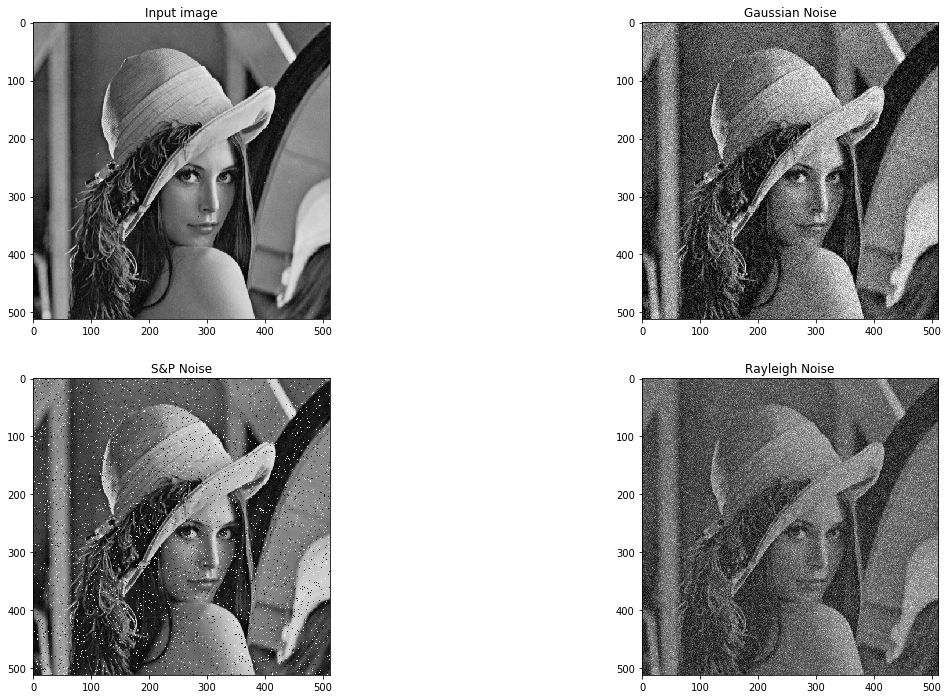

In [364]:
fig, ax = plt.subplots(2,2, figsize=(20, 12))
ax[0][0].imshow(I, cmap='gray')
ax[0][0].set_title('Input image')
ax[0][1].imshow(IG, cmap='gray')
ax[0][1].set_title('Gaussian Noise')
ax[1][0].imshow(ISP, cmap='gray')
ax[1][0].set_title('S&P Noise')
ax[1][1].imshow(IR, cmap='gray')
ax[1][1].set_title('Rayleigh Noise')

## Restoration of Noisy Images

### Filter the original image

In [367]:
# arithmetic mean filter
Iamf = ndimage.uniform_filter(I, size=3, mode='constant', cval=0)
# geometric mean filter
Igmf = np.exp(ndimage.convolve(np.log(I), np.ones((3,3)), mode='nearest')) ** (1/(3*3))
# harmonic mean filter
Ihmf = (3*3) / (ndimage.convolve(1/(I+0.000001), np.ones((3,3)), mode='nearest'))

array([[0.23877996, 0.35816993, 0.35729847, ..., 0.37211329, 0.32810458,
        0.19912854],
       [0.35860566, 0.53769063, 0.53638344, ..., 0.55904139, 0.49324619,
        0.29934641],
       [0.35860566, 0.53769063, 0.53594771, ..., 0.55904139, 0.49324619,
        0.29934641],
       ...,
       [0.05533769, 0.09237473, 0.09760349, ..., 0.26971678, 0.26971678,
        0.17647059],
       [0.0540305 , 0.09368192, 0.09978214, ..., 0.27102397, 0.27668845,
        0.18344227],
       [0.03834423, 0.06623094, 0.07145969, ..., 0.18039216, 0.18779956,
        0.12679739]])

Text(0.5, 1.0, 'Harmonic mean filter')

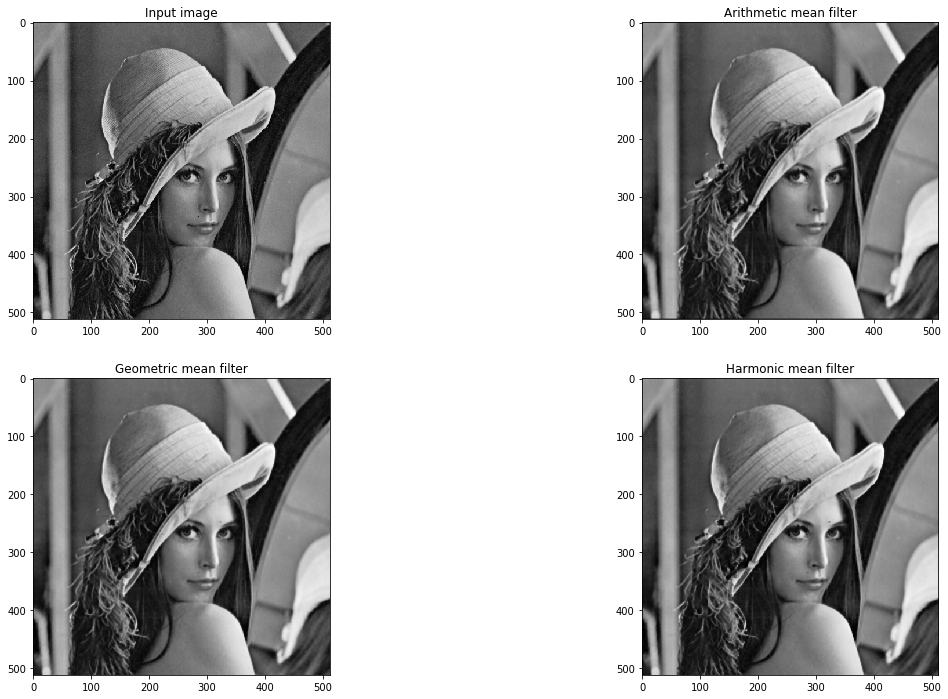

In [371]:
fig, ax = plt.subplots(2,2, figsize=(20, 12))
ax[0][0].imshow(I, cmap='gray')
ax[0][0].set_title('Input image')
ax[0][1].imshow(Iamf, cmap='gray')
ax[0][1].set_title('Arithmetic mean filter')
ax[1][0].imshow(Igmf, cmap='gray')
ax[1][0].set_title('Geometric mean filter')
ax[1][1].imshow(Ihmf, cmap='gray')
ax[1][1].set_title('Harmonic mean filter')

### Filter the gaussian noisy image

In [372]:
# arithmetic mean filter
IGamf = ndimage.uniform_filter(IG, size=3, mode='constant', cval=0)
# geometric mean filter
IGgmf = np.exp(ndimage.convolve(np.log(IG), np.ones((3,3)), mode='nearest')) ** (1/(3*3))
# harmonic mean filter
IGhmf = (3*3) / (ndimage.convolve(1/(IG+0.000001), np.ones((3,3)), mode='nearest'))

/Users/hidiryuzuguzel/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in log
  after removing the cwd from sys.path.


Text(0.5, 1.0, 'Harmonic mean filter')

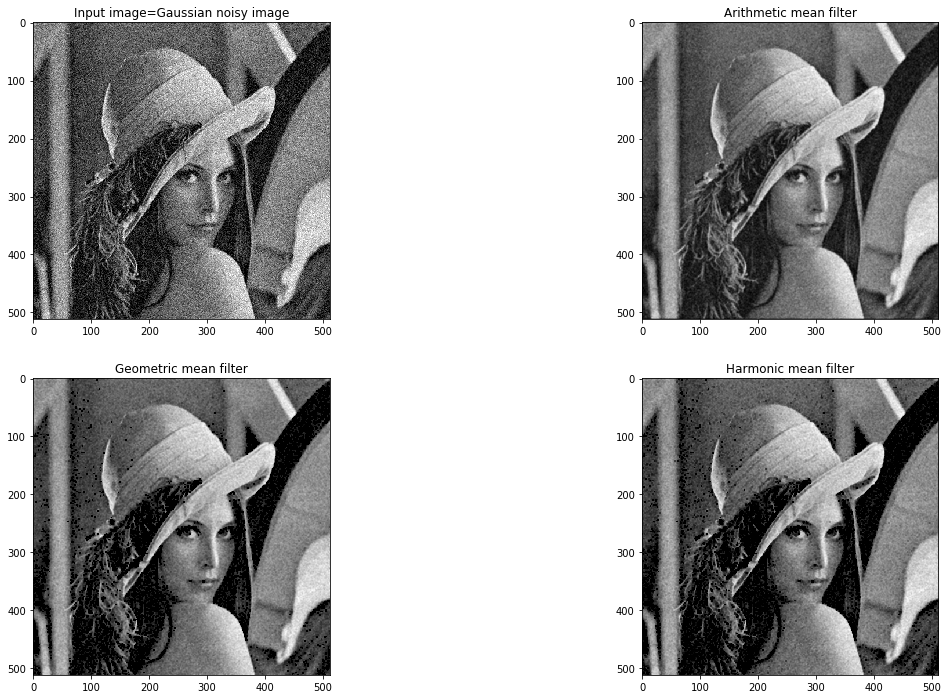

In [373]:
fig, ax = plt.subplots(2,2, figsize=(20, 12))
ax[0][0].imshow(IG, cmap='gray')
ax[0][0].set_title('Input image=Gaussian noisy image')
ax[0][1].imshow(IGamf, cmap='gray')
ax[0][1].set_title('Arithmetic mean filter')
ax[1][0].imshow(IGgmf, cmap='gray')
ax[1][0].set_title('Geometric mean filter')
ax[1][1].imshow(IGhmf, cmap='gray')
ax[1][1].set_title('Harmonic mean filter')

For gaussian noisy image, arithmetic mean filter is slightly better than geometric mean and harmonic mean
filters All three filters blur the image, however, geometric mean filter and harmonic mean filter applied images contain
some noise similar to salt & pepper style.

### Filter the S&P noise added image

In [375]:
# arithmetic mean filter
ISPamf = ndimage.uniform_filter(ISP, size=3, mode='constant', cval=0)
# geometric mean filter
ISPgmf = np.exp(ndimage.convolve(np.log(ISP), np.ones((3,3)), mode='nearest')) ** (1/(3*3))
# harmonic mean filter
ISPhmf = (3*3) / (ndimage.convolve(1/(ISP+0.000001), np.ones((3,3)), mode='nearest'))

/Users/hidiryuzuguzel/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in log
  after removing the cwd from sys.path.


Text(0.5, 1.0, 'Harmonic mean filter')

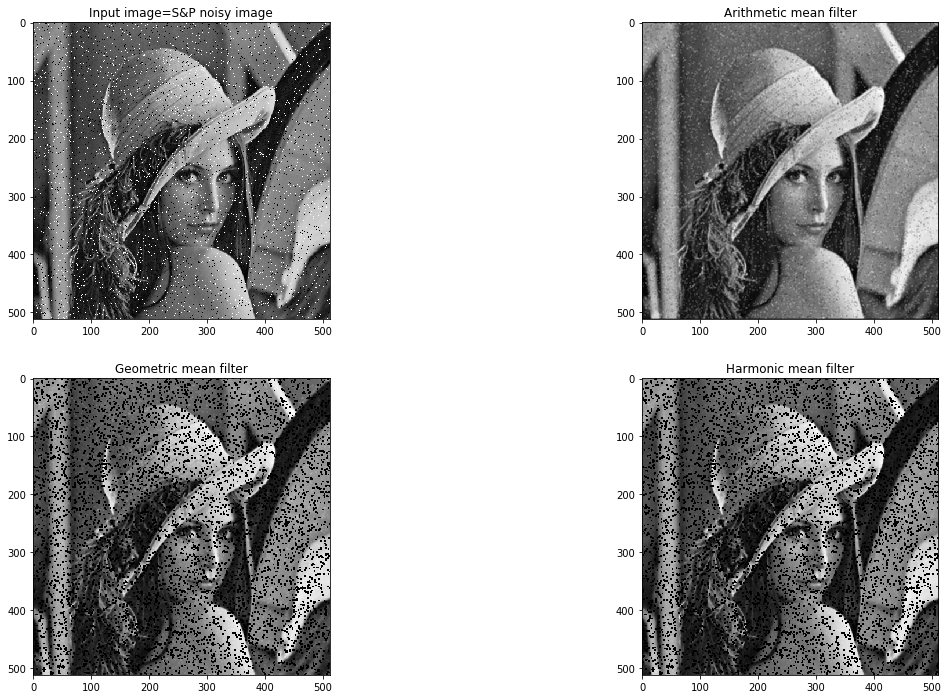

In [376]:
fig, ax = plt.subplots(2,2, figsize=(20, 12))
ax[0][0].imshow(ISP, cmap='gray')
ax[0][0].set_title('Input image=S&P noisy image')
ax[0][1].imshow(ISPamf, cmap='gray')
ax[0][1].set_title('Arithmetic mean filter')
ax[1][0].imshow(ISPgmf, cmap='gray')
ax[1][0].set_title('Geometric mean filter')
ax[1][1].imshow(ISPhmf, cmap='gray')
ax[1][1].set_title('Harmonic mean filter')

For Salt & Pepper noisy image, arithmetic mean filter is clearly superior to geometric mean and harmonic mean filters. Geometric mean and harmonic mean filters boost the Salt & Pepper noise.

### Filter the Rayleigh noise added image

In [377]:
# arithmetic mean filter
IRamf = ndimage.uniform_filter(IR, size=3, mode='constant', cval=0)
# geometric mean filter
IRgmf = np.exp(ndimage.convolve(np.log(IR), np.ones((3,3)), mode='nearest')) ** (1/(3*3))
# harmonic mean filter
IRhmf = (3*3) / (ndimage.convolve(1/(IR+0.000001), np.ones((3,3)), mode='nearest'))

Text(0.5, 1.0, 'Harmonic mean filter')

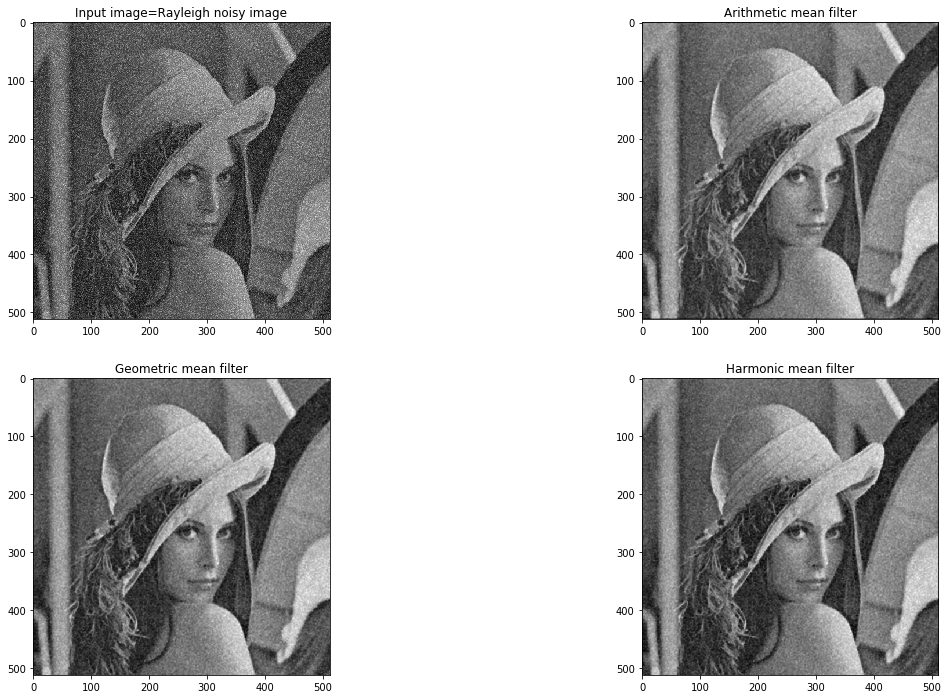

In [378]:
fig, ax = plt.subplots(2,2, figsize=(20, 12))
ax[0][0].imshow(IR, cmap='gray')
ax[0][0].set_title('Input image=Rayleigh noisy image')
ax[0][1].imshow(IRamf, cmap='gray')
ax[0][1].set_title('Arithmetic mean filter')
ax[1][0].imshow(IRgmf, cmap='gray')
ax[1][0].set_title('Geometric mean filter')
ax[1][1].imshow(IRhmf, cmap='gray')
ax[1][1].set_title('Harmonic mean filter')

For rayleigh noisy image, arithmetic mean, geometric mean and harmonic mean works equally well. All smoothed the
input image.

## Noise cleaning with Weighted Median Filter (WMF)

In [403]:
def weighted_median_filter(img, kernel_size, weight_kernel=None):
    """
    Apply weighted median filter to the given image
    """
    
    if weight_kernel is None:  # traditional median filter
        weight_kernel = np.ones((kernel_size[0], kernel_size[1]))
    
    PaddedImg = np.pad(img, (int((kernel_size[0]-1)/2), int((kernel_size[1]-1)/2)), 'constant', constant_values=(0, 0))
    nrow, ncol = PaddedImg.shape
    
    median_filtered_img = np.zeros_like(img)
    
    for i in range(nrow-kernel_size[0]+1):
        for j in range(ncol-kernel_size[1]+1):
            window = weight_kernel * PaddedImg[i:i+kernel_size[0], j:j+kernel_size[1]]
            median_filtered_img[i, j] = np.median(window.ravel())
            
    return median_filtered_img

In [387]:
Ibaboon = plt.imread('assets/baboon.png')[:,:,0]

In [404]:
ISP = random_noise(Ibaboon, mode='s&p', amount=0.2)
ISPMed = weighted_median_filter(ISP, (5,5)) # traditional median filter
weight_kernel = np.ones((5,5))
weight_kernel[2,2] = 5
ISPWMed = weighted_median_filter(ISP, (5,5), weight_kernel)

Text(0.5, 1.0, 'Median filtered S&P noisy image')

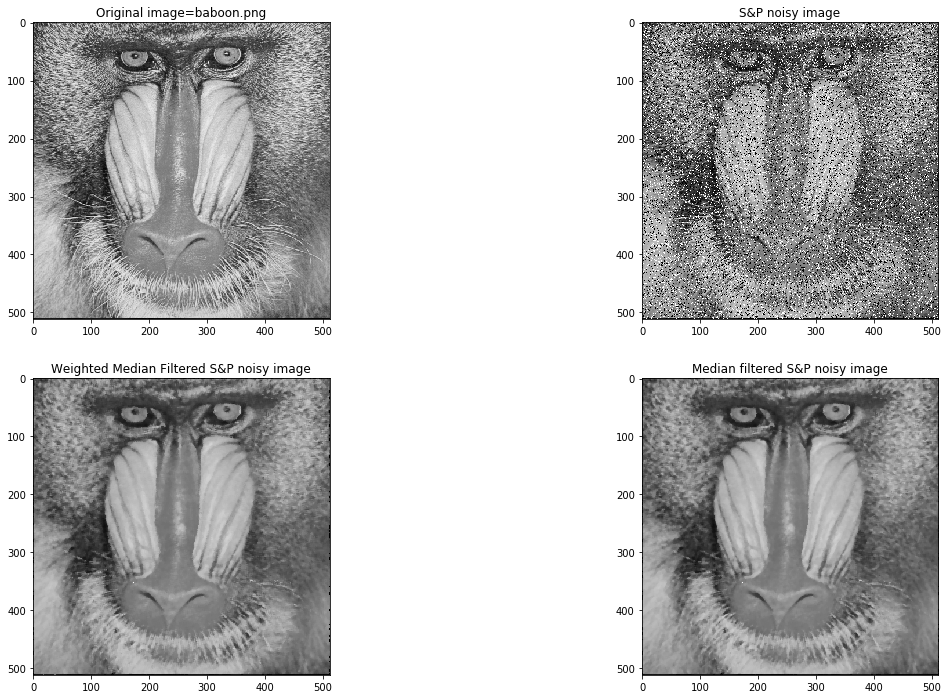

In [402]:
fig, ax = plt.subplots(2,2, figsize=(20, 12))
ax[0][0].imshow(Ibaboon, cmap='gray')
ax[0][0].set_title('Original image=baboon.png')
ax[0][1].imshow(ISP, cmap='gray')
ax[0][1].set_title('S&P noisy image')
ax[1][0].imshow(ISPWMed, cmap='gray')
ax[1][0].set_title('Weighted Median Filtered S&P noisy image')
ax[1][1].imshow(ISPMed, cmap='gray')
ax[1][1].set_title('Median filtered S&P noisy image')

# Ex9

## Image Restoration

Implement a motion blurring filter as follows:
    
$$H(u,v) = \frac{T}{\pi(ua+vb)}\sin[\pi(ua+vb)]\exp(-j\pi(ua+vb))$$

where $T$ is the exposure time of the camera and $a$ and $b$ are thte total distances covered by the motion of the image objects relative to the camera, in time $T$, for the x- and y- directions respectively.

In [515]:
f = plt.imread('assets/DIP.jpg')
T = 1 # exposure time
a = 0.1
b = 0.1
nrow, ncol = f.shape
u, v = np.meshgrid(np.arange(-nrow/2+1, nrow/2+1), np.arange(-ncol/2+1, ncol/2+1))

H = (T / (np.pi*(u*a+v*b)+0.0001)) * np.sin(np.pi*(u*a+v*b)) * np.exp(-1j*np.pi*(u*a+v*b))

In [516]:
PSF = np.real(np.fft.ifft2(H))
H = np.fft.fft2(PSF)

In [517]:
F = np.fft.fftshift(np.fft.fft2(f))
g = np.real(np.fft.ifft2(np.fft.ifftshift(H * F))) # degraded image
G = np.fft.fftshift(np.fft.fft2(g)) # transform of the degraded image

In [518]:
#y0 = H.shape[0]/2
#x0 = H.shape[1]/2
Finv = G / (H+0.001)
finvfilt = np.real(np.fft.ifft2(np.fft.ifftshift(Finv)))

Text(0.5, 1.0, 'Inverse filtered')

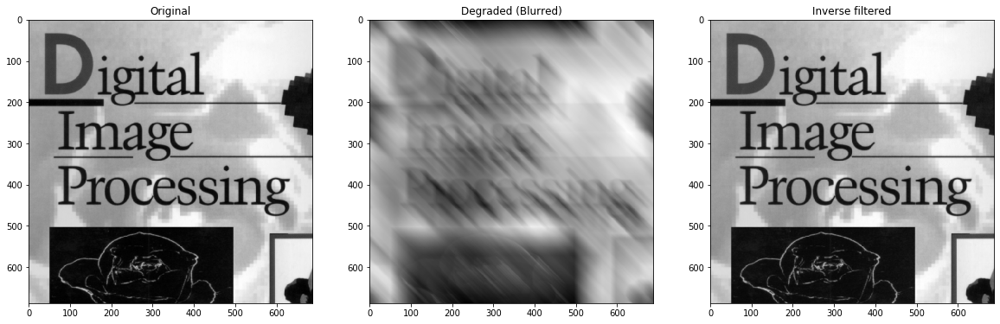

In [519]:
fig, ax = plt.subplots(1,3, figsize=(20, 12))
ax[0].imshow(f, cmap='gray')
ax[0].set_title('Original')
ax[1].imshow(g, cmap='gray')
ax[1].set_title('Degraded (Blurred)')
ax[2].imshow(finvfilt, cmap='gray')
ax[2].set_title('Inverse filtered')

## Image Restoration via Wiener Filtering

If there is blurring and noise in the system, the degradation model becomes:

\begin{equation}
G(u,v) = H(u,v)F(u,v) + N(u,v)
\end{equation}

where $G$ denotes the transform of degraded image $g$, $H$ is the transform of the blurring kernel $h$, $F$ is the transform of the undegraded image $f$, $N$ is the transform of the noise, $u,v$ are the frequency indices.

Now, if we try to restore the image via inverse filtering:

\begin{equation}
\tilde{F}(u,v) = \frac{G(u,v)}{H(u,v)} = F(u,v) + \frac{N(u,v)}{H(u,v)}
\end{equation}

Here, we do not know any information about the noise and therefore we cannot recover $f$.

In [467]:
eps = 1e-9

In [526]:
# degraded image
nu =  np.sqrt(1) * np.random.randn(g.shape[0], g.shape[1])
gnoisy = g + nu
Gnoisy = np.fft.fftshift(np.fft.fft2(gnoisy))

In [527]:
# inverse filter
Ginv = Gnoisy / (H+eps)
ginvfilt = np.fft.ifft2(np.fft.ifftshift(Ginv))

In [528]:
# Wiener filter with undegraded image
NU = np.fft.fftshift(np.fft.fft2(nu))
Gwiener = (1/(H + eps)) * ((np.abs(H)**2)/((np.abs(H)**2) + ((np.abs(NU)**2)/(np.abs(F)**2 + eps) + eps))) * Gnoisy;
gwiener = np.fft.ifft2(np.fft.ifftshift(Gwiener))

The wiener filter applied above requires us to know the power spectra of the undegraded image and noise.

In [529]:
# Wiener filter without undegraded image
k = 0.01
Gwienerhat = (1/(H+eps)) * ((np.abs(H)**2)/((np.abs(H)**2) + k)) * Gnoisy
gwienerhat = np.fft.ifft2(np.fft.ifftshift(Gwienerhat))

The wiener filter applied above replaces the ratio of power sprectra with a constant $k$, however, estimating $k$ is not always a suitable solution.

Text(0.5, 1.0, 'Wiener (without undegraded image)')

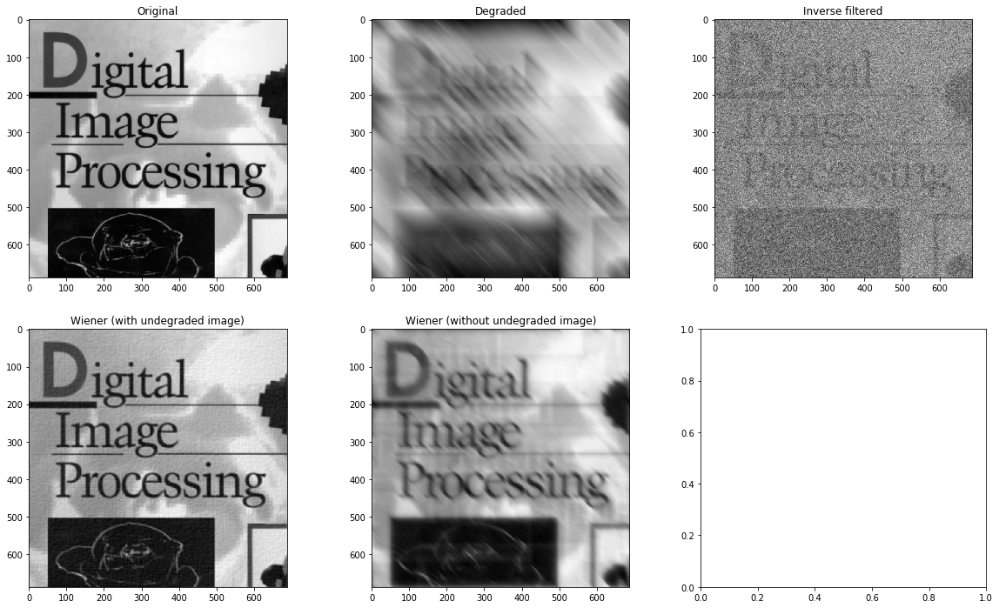

In [530]:
fig, ax = plt.subplots(2,3, figsize=(20, 12))
ax[0][0].imshow(f, cmap='gray')
ax[0][0].set_title('Original')
ax[0][1].imshow(np.real(gnoisy), cmap='gray')
ax[0][1].set_title('Degraded')
ax[0][2].imshow(np.real(ginvfilt), cmap='gray')
ax[0][2].set_title('Inverse filtered')
ax[1][0].imshow(np.real(gwiener), cmap='gray')
ax[1][0].set_title('Wiener (with undegraded image)')
ax[1][1].imshow(np.real(gwienerhat), cmap='gray')
ax[1][1].set_title('Wiener (without undegraded image)')

# Ex10 

## Histogram Equalization for Color Images

In [531]:
I = plt.imread('assets/fruits.jpg')
I.shape

(512, 771, 3)

In [539]:
Iout = np.zeros_like(I)
for idx in range(3):
    Iout[:,:,idx] = histequal(I[:,:,idx])

In [598]:
def intensityeq(im_in):
    import matplotlib.colors as mcolors
    im = mcolors.rgb_to_hsv(im_in)
    im[:,:,2] = cv2.equalizeHist(im[:,:,2].astype('uint8'))/255
    im_out = mcolors.hsv_to_rgb(im)
    return im_out

In [599]:
Iout1 = intensityeq(I)

Text(0.5, 1.0, 'Output b')

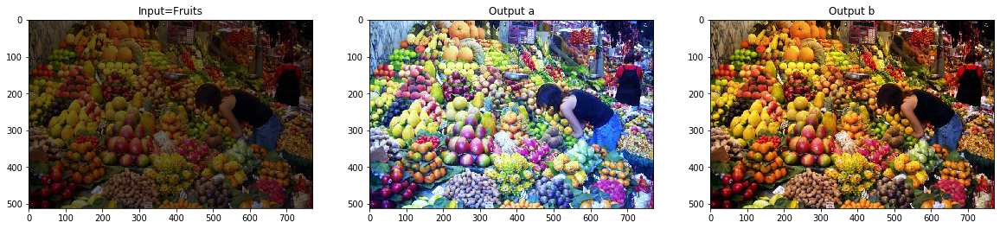

In [600]:
fig, ax = plt.subplots(1,3, figsize=(20, 12))
ax[0].imshow(I)
ax[0].set_title('Input=Fruits')
ax[1].imshow(Iout)
ax[1].set_title('Output a')
ax[2].imshow(Iout1)
ax[2].set_title('Output b')

In [602]:
I = plt.imread('assets/festia.jpg')

Iout = np.zeros_like(I)
for idx in range(3):
    Iout[:,:,idx] = histequal(I[:,:,idx])
    
Iout1 = intensityeq(I)

Text(0.5, 1.0, 'Output b')

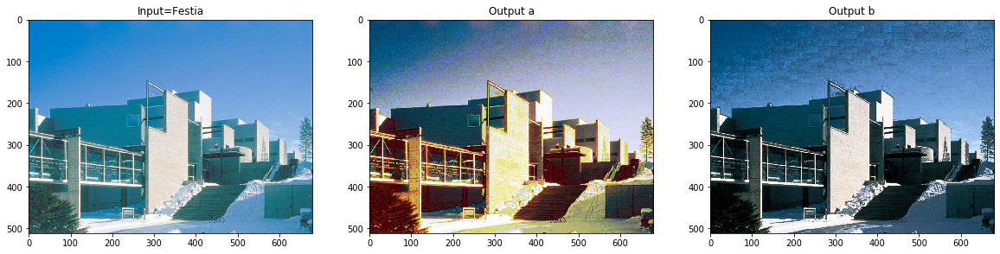

In [604]:
fig, ax = plt.subplots(1,3, figsize=(20, 12))
ax[0].imshow(I)
ax[0].set_title('Input=Festia')
ax[1].imshow(Iout)
ax[1].set_title('Output a')
ax[2].imshow(Iout1)
ax[2].set_title('Output b')